In [22]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [23]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, transforms, models
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import os
import time
from torch.utils.tensorboard import SummaryWriter

In [24]:
PROJECT_DIR = '/content/drive/MyDrive/PlantDisease_Project'
LOG_DIR = os.path.join(PROJECT_DIR, 'runs')
CHECKPOINT_DIR = os.path.join(PROJECT_DIR, 'checkpoints')

os.makedirs(LOG_DIR, exist_ok=True)
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

In [25]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


In [26]:
torch.manual_seed(42)
np.random.seed(42)

In [27]:
DATA_DIR = '/content/drive/MyDrive/color'
IMG_SIZE = 256
BATCH_SIZE = 32
LEARNING_RATE = 0.001
EPOCHS = 15

In [28]:
MAX_IMAGES_PER_CLASS = 4000

train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(IMG_SIZE),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_test_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [29]:
dataset_full = datasets.ImageFolder(DATA_DIR)
class_names = dataset_full.classes
num_classes = len(class_names)

In [30]:
print(f"Found {num_classes} classes: {class_names}")

Found 34 classes: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___

In [31]:
indices_per_class = {i: [] for i in range(num_classes)}
all_limited_indices = []

for idx, label in enumerate(dataset_full.targets):
    if len(indices_per_class[label]) < MAX_IMAGES_PER_CLASS:
        indices_per_class[label].append(idx)
        all_limited_indices.append(idx)

total_limited_data = len(all_limited_indices)
print(f"Total data after limiting: {total_limited_data} images")

Total data after limiting: 45433 images


In [32]:
np.random.shuffle(all_limited_indices)

train_count = int(0.8 * total_limited_data)
val_count = int(0.1 * total_limited_data)
test_count = total_limited_data - train_count - val_count

train_idx = all_limited_indices[:train_count]
val_idx = all_limited_indices[train_count : train_count + val_count]
test_idx = all_limited_indices[train_count + val_count :]

In [33]:
dataset_aug = datasets.ImageFolder(DATA_DIR, transform=train_transforms)
dataset_clean = datasets.ImageFolder(DATA_DIR, transform=val_test_transforms)

train_dataset = Subset(dataset_aug, train_idx)
val_dataset   = Subset(dataset_clean, val_idx)
test_dataset  = Subset(dataset_clean, test_idx)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True,)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

In [34]:
train_targets = [dataset_full.targets[i] for i in train_idx]
class_counts = np.bincount(train_targets, minlength=num_classes)

class_counts = np.where(class_counts == 0, 1, class_counts)

class_weights = len(train_targets) / (num_classes * class_counts)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

In [35]:
model = models.efficientnet_b0(weights='IMAGENET1K_V1')

for param in model.features.parameters():
    param.requires_grad = False

in_features = model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(in_features, num_classes)
)

model = model.to(device)

In [36]:
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

In [37]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs, device,
                log_dir,
                checkpoint_path,
                best_model_path,
                start_epoch=0,
                resume_history=None):

    os.makedirs(log_dir, exist_ok=True)

    writer = SummaryWriter(log_dir)
    print(f"TensorBoard logging at: {log_dir}")

    if resume_history:
        history = resume_history
        print(f"Resuming history from epoch {start_epoch}")
    else:
        history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

    start_time = time.time()
    best_acc = 0.0

    if resume_history and len(resume_history['val_acc']) > 0:
         best_acc = max(resume_history['val_acc'])

    print(f"Starting training from epoch {start_epoch+1} to {num_epochs}...")

    for epoch in range(start_epoch, num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs}")

        # --- TRAIN ---
        model.train()
        running_loss, correct, total = 0.0, 0, 0
        batch_start_time = time.time()

        for batch_idx, (images, labels) in enumerate(train_loader):
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            if (batch_idx + 1) % 10 == 0:
                print(f"\rBatch {batch_idx+1}/{len(train_loader)} | Loss: {loss.item():.4f}", end="")

        epoch_train_loss = running_loss / len(train_loader)
        epoch_train_acc = 100 * correct / total

        # --- VAL ---
        model.eval()
        val_loss_accum, val_correct, val_total = 0.0, 0, 0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss_accum += loss.item()
                _, predicted = torch.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        epoch_val_loss = val_loss_accum / len(val_loader)
        epoch_val_acc = 100 * val_correct / val_total

        # --- LOGGING ---
        history['train_loss'].append(epoch_train_loss)
        history['val_loss'].append(epoch_val_loss)
        history['train_acc'].append(epoch_train_acc)
        history['val_acc'].append(epoch_val_acc)

        writer.add_scalar('Loss/train', epoch_train_loss, epoch)
        writer.add_scalar('Loss/val', epoch_val_loss, epoch)
        writer.add_scalar('Accuracy/train', epoch_train_acc, epoch)
        writer.add_scalar('Accuracy/val', epoch_val_acc, epoch)

        print(f"\n   -> Train Loss: {epoch_train_loss:.4f} Acc: {epoch_train_acc:.2f}%")
        print(f"   -> Val   Loss: {epoch_val_loss:.4f} Acc: {epoch_val_acc:.2f}%")

        # --- SAVE TO DRIVE ---
        checkpoint = {
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'history': history,
            'best_acc': best_acc
        }

        torch.save(checkpoint, checkpoint_path)

        if epoch_val_acc > best_acc:
            best_acc = epoch_val_acc
            torch.save(model.state_dict(), best_model_path)
            print(f"New Best Model Saved to Drive (Acc: {best_acc:.2f}%)")

    writer.close()
    return history

In [38]:
MY_CHECKPOINT = os.path.join(CHECKPOINT_DIR, 'last_checkpoint.pth')
MY_BEST_MODEL = os.path.join(CHECKPOINT_DIR, 'best_model.pth')
MY_LOG_DIR = os.path.join(LOG_DIR, 'experiment_1')

start_epoch = 0
resume_history = None

if os.path.exists(MY_CHECKPOINT):
    print("Loading checkpoint...")

    checkpoint = torch.load(MY_CHECKPOINT, map_location=torch.device('cpu'))
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch']
    resume_history = checkpoint['history']
else:
    print("No checkpoint found in Drive.")

history = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion,
    optimizer=optimizer,
    num_epochs=EPOCHS,
    device=device,
    log_dir=MY_LOG_DIR,
    checkpoint_path=MY_CHECKPOINT,
    best_model_path=MY_BEST_MODEL,
    start_epoch=start_epoch,
    resume_history=resume_history
)

Loading checkpoint...
TensorBoard logging at: /content/drive/MyDrive/PlantDisease_Project/runs/experiment_1
Resuming history from epoch 15
Starting training from epoch 16 to 15...


Checkpoint Training

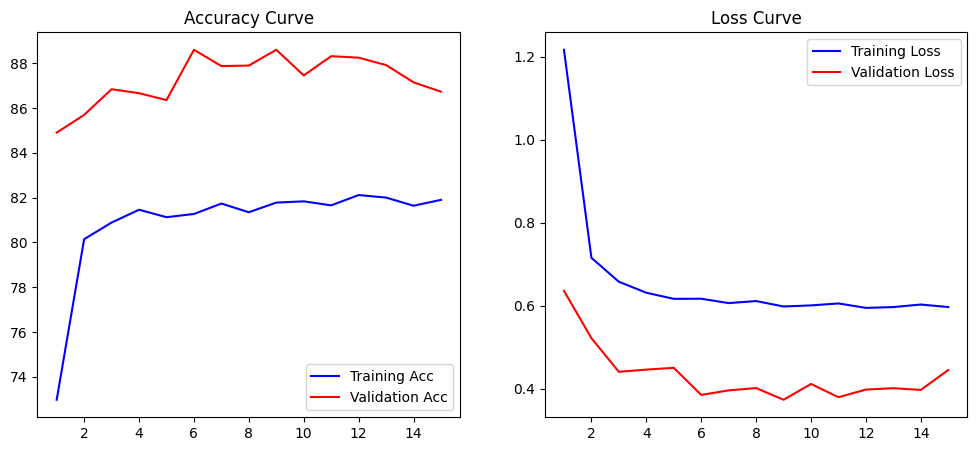

In [39]:
acc = history['train_acc']
val_acc = history['val_acc']
loss = history['train_loss']
val_loss = history['val_loss']
epochs = range(1, len(acc) + 1)

plt.figure(figsize=(12, 5))

# Plot Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs, acc, 'b-', label='Training Acc')
plt.plot(epochs, val_acc, 'r-', label='Validation Acc')
plt.title('Accuracy Curve')
plt.legend()

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'b-', label='Training Loss')
plt.plot(epochs, val_loss, 'r-', label='Validation Loss')
plt.title('Loss Curve')
plt.legend()

plt.show()

In [40]:
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)



Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.84      0.92      0.88        61
                                 Apple___Black_rot       0.92      0.85      0.88        65
                          Apple___Cedar_apple_rust       0.79      1.00      0.88        26
                                   Apple___healthy       0.92      0.88      0.90       166
                               Blueberry___healthy       0.86      0.96      0.91       139
          Cherry_(including_sour)___Powdery_mildew       0.95      0.94      0.94       110
                 Cherry_(including_sour)___healthy       0.90      0.99      0.94        87
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.69      0.58      0.63        59
                       Corn_(maize)___Common_rust_       0.97      0.80      0.87       113
               Corn_(maize)___Northern_Leaf_Blight     

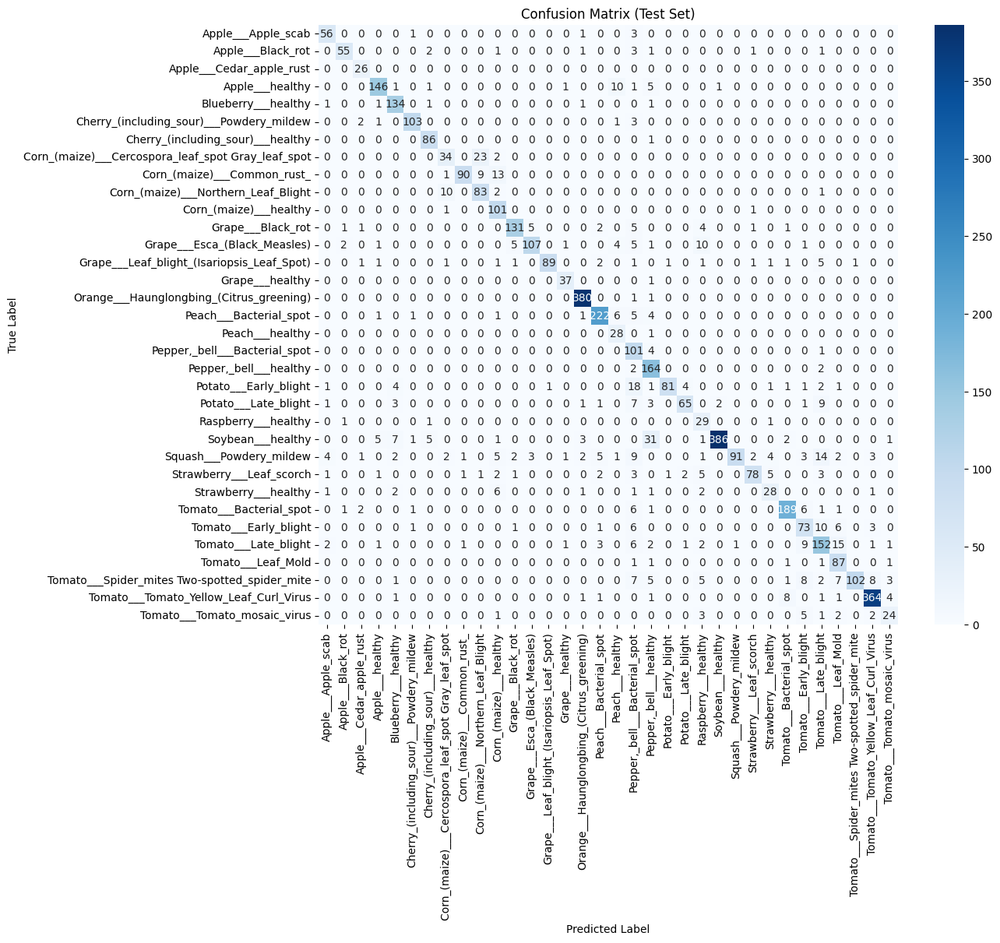

In [41]:
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Test Set)')
plt.show()

In [42]:
torch.save(model.state_dict(), 'plant_disease_model.pth')

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


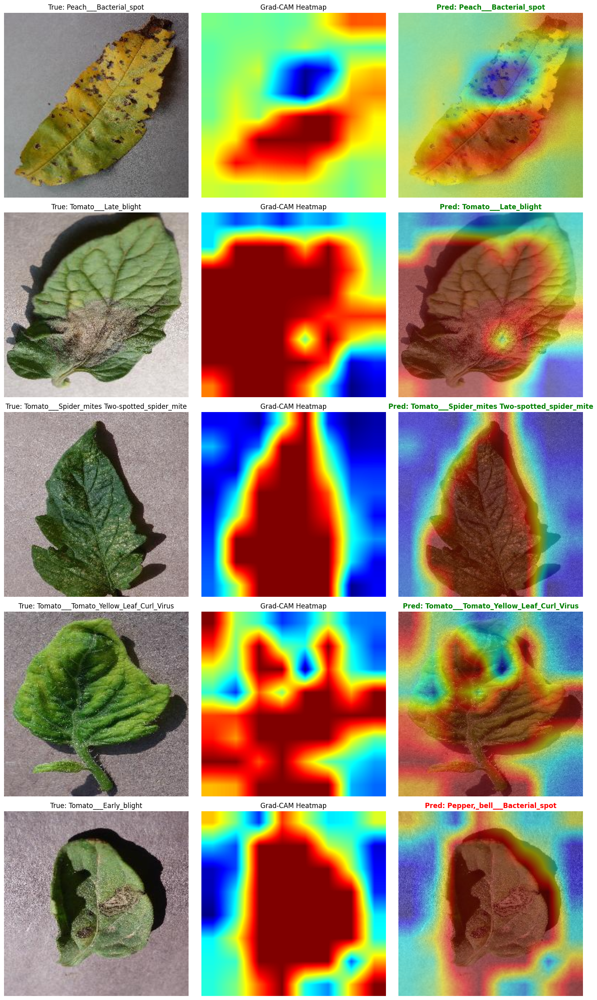

In [45]:
import cv2
import torch.nn.functional as F

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.gradients = None
        self.activations = None

        target_layer.register_forward_hook(self.save_activation)
        target_layer.register_full_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def __call__(self, x, class_idx=None):
        output = self.model(x)

        if class_idx is None:
            class_idx = torch.argmax(output, dim=1)

        self.model.zero_grad()

        target = output[:, class_idx]
        target.backward(retain_graph=True)

        if self.gradients is None:
            raise ValueError("Gradient not found!")

        gradients = self.gradients
        activations = self.activations

        weights = torch.mean(gradients, dim=(2, 3), keepdim=True)

        cam = torch.sum(weights * activations, dim=1, keepdim=True)

        cam = F.relu(cam)
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-7)

        return cam.data.cpu().numpy()[0, 0], class_idx.item()

def denormalize_image(tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = tensor.permute(1, 2, 0).cpu().numpy()
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img

def show_gradcam(model, loader, device, num_samples=5):
    target_layer = model.features[-1]

    for param in target_layer.parameters():
        param.requires_grad = True

    grad_cam = GradCAM(model, target_layer)

    data_iter = iter(loader)
    images, labels = next(data_iter)
    images = images.to(device)
    labels = labels.to(device)

    plt.figure(figsize=(15, 5 * num_samples))

    try:
        for i in range(min(num_samples, len(images))):
            img_tensor = images[i].unsqueeze(0).clone().detach()
            img_tensor.requires_grad = True
            img_tensor = img_tensor.to(device)

            mask, pred_idx = grad_cam(img_tensor, class_idx=None)

            img_vis = denormalize_image(images[i])
            mask_resized = cv2.resize(mask, (img_vis.shape[1], img_vis.shape[0]))

            heatmap = cv2.applyColorMap(np.uint8(255 * mask_resized), cv2.COLORMAP_JET)
            heatmap = np.float32(heatmap) / 255

            cam_result = heatmap + np.float32(img_vis)
            cam_result = cam_result / np.max(cam_result)

            plt.subplot(num_samples, 3, 3*i + 1)
            plt.imshow(img_vis)
            plt.title(f"True: {class_names[labels[i].item()]}")
            plt.axis('off')

            plt.subplot(num_samples, 3, 3*i + 2)
            plt.imshow(heatmap)
            plt.title("Grad-CAM Heatmap")
            plt.axis('off')

            plt.subplot(num_samples, 3, 3*i + 3)
            plt.imshow(cam_result)
            pred_label = class_names[pred_idx]
            color = 'green' if pred_idx == labels[i].item() else 'red'
            plt.title(f"Pred: {pred_label}", color=color, fontweight='bold')
            plt.axis('off')

    finally:
        for param in target_layer.parameters():
            param.requires_grad = False

    plt.tight_layout()
    plt.show()

show_gradcam(model, test_loader, device, num_samples=5)

In [47]:
%load_ext tensorboard
%tensorboard --logdir "/content/drive/MyDrive/PlantDisease_Project/runs/experiment_1"
%reload_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 12662), started 0:00:16 ago. (Use '!kill 12662' to kill it.)

<IPython.core.display.Javascript object>